In [1]:
import os
import pandas
import numpy
import plotly.express as px
import matplotlib.pyplot as plt 

In [7]:
def get_data_list(filepath):
    data_list = []
    for filename in os.listdir(filepath):
        if filename.endswith('pkl'):
            continue
        print(filename)
        file = os.path.join(filepath, filename)
        data_list.append(pandas.read_csv(file))
    return data_list

In [8]:
data_list = get_data_list("/Users/liavkeren/bachelor_thesis/bachelor_thesis_code/training_model/src/data/subject1")#os.getenv('PATH_TO_TM')+ "/src/data/subject1")
#data_to_visualize = ""
#data_vis = pandas.read_csv(data_to_visualize)
#data_vis

test_from_29_05_2024.csv
subject1_11_06_2024_09_36_21_raw_eye_tracker_data.csv
test_04_06_2024_17_33_43_raw_eye_tracker_data.csv
test_05_06_2024_12_03_10_raw_eye_tracker_data.csv


In [18]:
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt 

df_2 = data_list[3]
df_2['FPOGX'] =  df_2[(df_2['FPOGX']>=0) & (df_2['FPOGX']<1)]['FPOGX']
df_2['FPOGY'] =  df_2[(df_2['FPOGY']>=0) & (df_2['FPOGY']<1)]['FPOGY']
df_counts = df_2.groupby(['FPOGX', 'FPOGY']).size().reset_index(name='count')
df_with_counts = pandas.merge(df_2, df_counts, on=['FPOGX', 'FPOGY'], how='left')

#fig = px.scatter(x=df_2['FPOGX'], y=df_2['FPOGY'])
#fig = px.imshow(df_with_counts[['FPOGX', 'FPOGY', 'count']].values.tolist())
#fig.show()

df_keep = df_with_counts[['FPOGX', 'FPOGY', 'count']].dropna()
df_keep.values.tolist()[:1000]

fig = px.density_heatmap(df_counts, x='FPOGX', y='FPOGY')

fig.update_layout(
    images=[go.layout.Image(
        source='/Users/liavkeren/bachelor_thesis/bachelor_thesis_code/training_model/src/data/visualize/Screenshot 2024-06-11 100545(1).png',  # Path to your background image
        xref="x", yref="y",
        x=0, y=1,  # Positioning the image
        sizex=1, sizey=1,
        sizing="stretch",
        opacity=0.5,  # Adjust the opacity
        layer="below"
    )]
)


fig.show()

In [20]:
!pip install seaborn

  Using cached seaborn-0.13.2-py3-none-any.whl.metadata (5.4 kB)
Using cached seaborn-0.13.2-py3-none-any.whl (294 kB)


<Figure size 1000x800 with 0 Axes>

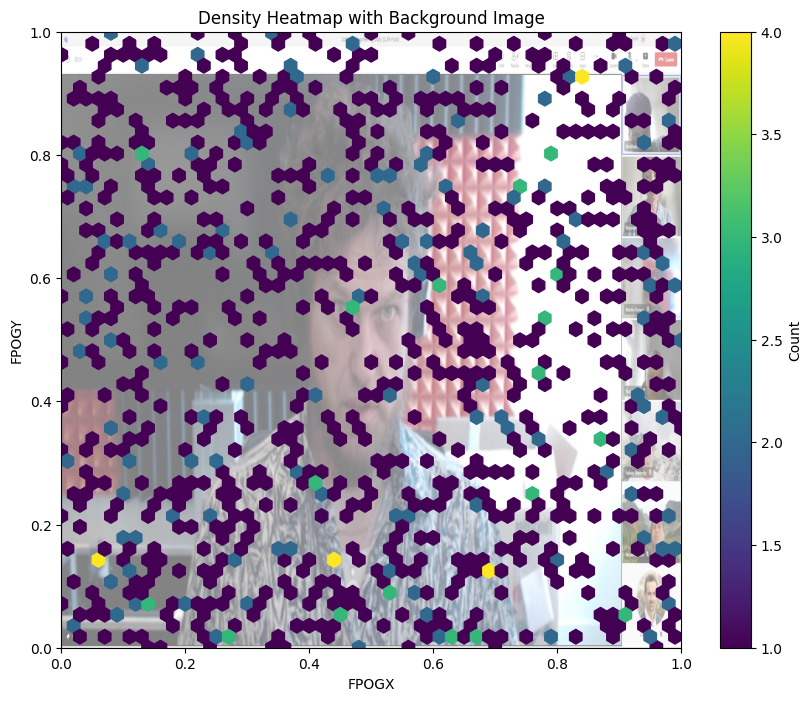

In [22]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LogNorm
from PIL import Image

# Example data (replace this with your actual data loading)
data_list = [pd.DataFrame({'FPOGX': np.random.rand(1000), 'FPOGY': np.random.rand(1000)}) for _ in range(4)]
df_2 = data_list[3]

# Filtering FPOGX and FPOGY to be within [0, 1)
df_2 = df_2[(df_2['FPOGX'] >= 0) & (df_2['FPOGX'] < 1)]
df_2 = df_2[(df_2['FPOGY'] >= 0) & (df_2['FPOGY'] < 1)]

# Group by FPOGX and FPOGY and count occurrences
df_counts = df_2.groupby(['FPOGX', 'FPOGY']).size().reset_index(name='count')

# Convert to numpy array for plotting
x = df_counts['FPOGX'].values
y = df_counts['FPOGY'].values
z = df_counts['count'].values

# Load background image
background = Image.open('/Users/liavkeren/bachelor_thesis/bachelor_thesis_code/training_model/src/data/visualize/Screenshot 2024-06-11 100545(1).png')

# Plotting
plt.figure(figsize=(10, 8))

# Display the background image
# Plotting
fig, ax = plt.subplots(figsize=(10, 8))

# Display the background image
ax.imshow(background, extent=[0, 1, 0, 1], aspect='auto', alpha=0.5)

# Create hexbin heatmap
hb = ax.hexbin(x, y, C=z, gridsize=50, cmap='viridis', reduce_C_function=np.sum)

# Add color bar
cb = fig.colorbar(hb, ax=ax)
cb.set_label('Count')

ax.set_xlabel('FPOGX')
ax.set_ylabel('FPOGY')
ax.set_title('Density Heatmap with Background Image')

plt.show()

In [17]:
import plotly.graph_objects as go
df_2 = data_vis
df_2['FPOGX'] =  df_2[(df_2['FPOGX']>=0) & (df_2['FPOGX']<1)]['FPOGX']
df_2['FPOGY'] =  df_2[(df_2['FPOGY']>=0) & (df_2['FPOGY']<1)]['FPOGY']
df_counts = df_2.groupby(['FPOGX', 'FPOGY']).size().reset_index(name='count')
df_with_counts = pandas.merge(df_2, df_counts, on=['FPOGX', 'FPOGY'], how='left')

#fig = px.scatter(x=df_2['FPOGX'], y=df_2['FPOGY'])
#fig = px.imshow(df_with_counts[['FPOGX', 'FPOGY', 'count']].values.tolist())
#fig.show()

df_keep = df_with_counts[['FPOGX', 'FPOGY', 'count']].dropna()
df_keep.values.tolist()[:1000]

fig = go.Figure()

fig.add_densitymapbox(go.Densitymapbox(df_counts, x='FPOGX', y='FPOGY'))

fig.add_layout_image(dict(source = "/Users/liavkeren/bachelor_thesis/bachelor_thesis_code/training_model/src/data/subject1/Screenshot 2024-06-11 100545.png"))

fig.show()

SyntaxError: unterminated string literal (detected at line 19) (2109908067.py, line 19)

In [10]:
import plotly.graph_objects as go

fig = go.Figure()
_ 123
for df in data_list:

    fpovx_3 =  df[(df['FPOGX']>=0) & (df['FPOGX']<1)]['FPOGX']
    fpovy_3 =  df[(df['FPOGY']>=0) & (df['FPOGY'] < 1)]['FPOGY']

    fig.add_trace(go.Scatter(x=fpovx_3, y=fpovy_3,
                        mode='markers',
                        name='gaze point second trial'))

fig.show()

SyntaxError: invalid syntax (2238869715.py, line 4)

# View Gaze for first trial

In [76]:
from sklearn.cluster import KMeans
df_2 = data_list[1]
pog = pandas.DataFrame()
mask_x = (df_2['FPOGX']>=0) & (df_2['FPOGX']<1)
pog['FPOGX'] = df_2[mask_x]['FPOGX']

mask_y = (df_2['FPOGY']>=0) & (df_2['FPOGY']<1)
pog['FPOGY'] = df_2[mask_x]['FPOGY']
pog
X = pog[['FPOGX','FPOGY']].values

kmeans = KMeans(n_clusters=4)
kmeans.fit(X)

labels = kmeans.labels_
centroids = kmeans.cluster_centers_

n_clusters= 4

fig = go.Figure()

for cluster in range(n_clusters):
    # Filter points belonging to the current cluster
    cluster_points = X[labels == cluster]
    
    # Plot the points
    fig.add_trace(
        go.Scatter(
            x = cluster_points[:, 0], 
            y = cluster_points[:, 1], 
            mode='markers',
            name='gaze points'))
    

fig.show()

In [66]:
X = df_2[['FPOGX', 'FPOGY']].values
X

array([[0.16356, 0.18706],
       [0.16336, 0.18692],
       [0.16306, 0.18649],
       ...,
       [0.53969, 0.19126],
       [0.53949, 0.19125],
       [0.53929, 0.19127]])

In [5]:
import plotly.graph_objects as go

df_1 = data_list[0]
rpd = df_1['RPD']
lpd = df_1['LPD']
rpcx = df_1['RPCX']
time = df_1['TIME']

fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=time, y=lpd,
                    mode='lines',
                    name='left pupil size'))

fig.add_trace(go.Scatter(x=time, y=rpd,
                    mode='lines',
                    name='left pupil size'))

fig.show()

In [12]:
fig = px.scatter(x=data_list[0]['FPOGX'], y=data_list[0]['FPOGY'])

fig.show()